In [1]:
library(rgdal) # project, also reads naturalearth data
library(rgeos) # polygon splitting
library(maps)
library(maptools)
library(raster)
library(magrittr)
library(tidyverse)

source("../th-maps.R") # convenience functions for plotting rotated and projected maps

Loading required package: sp
rgdal: version: 1.2-15, (SVN revision 691)
 Geospatial Data Abstraction Library extensions to R successfully loaded
 Loaded GDAL runtime: GDAL 2.2.1, released 2017/06/23
 Path to GDAL shared files: /usr/share/gdal/2.2
 GDAL binary built with GEOS: TRUE 
 Loaded PROJ.4 runtime: Rel. 4.9.3, 15 August 2016, [PJ_VERSION: 493]
 Path to PROJ.4 shared files: (autodetected)
 Linking to sp version: 1.2-5 
rgeos version: 0.3-26, (SVN revision 560)
 GEOS runtime version: 3.5.1-CAPI-1.9.1 r4246 
 Linking to sp version: 1.2-5 
 Polygon checking: TRUE 

Checking rgeos availability: TRUE

Attaching package: ‘magrittr’

The following object is masked from ‘package:raster’:

    extract

Loading tidyverse: ggplot2
Loading tidyverse: tibble
Loading tidyverse: tidyr
Loading tidyverse: readr
Loading tidyverse: purrr
Loading tidyverse: dplyr
Warning message:
“package ‘ggplot2’ was built under R version 3.4.3”Warning message:
“package ‘tibble’ was built under R version 3.4.3”War

## Generate world map

In [2]:
# Jupyter only!!! High Qual Plot
options(repr.plot.width=12, repr.plot.height=5, repr.plot.res=1024, repr.plot.quality=100)
# defaults: options(repr.plot.width=7, repr.plot.height=7, repr.plot.res=120, repr.plot.quality=90)
theme_set(theme_void(base_size=14))

shift <- 90
m <- world_map(shift)

gg <- ggplot() +
    geom_polygon(data=m$map, aes(x=long, y=lat, group=group), fill="grey80", color="grey80") +
    geom_path(data=m$inner_grid, aes(x=long, y=lat, group=group), linetype = 1, color = "grey70", size = .5, alpha=.3) +
    geom_path(data=m$outer_grid, aes(x=long, y=lat, group=group), linetype = 1, color = "grey70", size = 1) +
    coord_equal(ylim = c(-59.1, 59.1))
gg

Warning message:
“New theme missing the following elements: axis.title.x, axis.title.x.top, axis.title.y, axis.title.y.right, axis.text.x, axis.text.x.top, axis.text.y, axis.text.y.right, axis.ticks, axis.line, axis.line.x, axis.line.y, legend.background, legend.margin, legend.spacing, legend.spacing.x, legend.spacing.y, legend.key, legend.key.height, legend.key.width, legend.text.align, legend.title.align, legend.direction, legend.justification, legend.box, legend.box.margin, legend.box.background, legend.box.spacing, panel.background, panel.border, panel.spacing.x, panel.spacing.y, panel.grid, panel.grid.minor, plot.background, strip.background, strip.placement, strip.text.x, strip.text.y”Warning message in gBuffer(worldmapPolys, byid = TRUE, width = 0):
“Spatial object is not projected; GEOS expects planar coordinates”Warning message in gBuffer(line.gInt, byid = TRUE, width = 1e-06):
“Spatial object is not projected; GEOS expects planar coordinates”Warning message in SpatialPolygons

In [3]:
# remove excessive whitespace around map
theme(plot.margin=grid::unit(rep(c(-15), 4), "mm"))

# inset legend into map
mytheme <- theme(
        legend.background = element_rect(fill="white", colour = "grey70", size=1),
        legend.justification=c(0,1),
        legend.position=c(.75,.9),
        legend.text.align=0)

List of 1
 $ plot.margin:Class 'unit'  atomic [1:4] -15 -15 -15 -15
  .. ..- attr(*, "valid.unit")= int 7
  .. ..- attr(*, "unit")= chr "mm"
 - attr(*, "class")= chr [1:2] "theme" "gg"
 - attr(*, "complete")= logi FALSE
 - attr(*, "validate")= logi TRUE

## Geotraces Stations

In [6]:
# get data from git repo
bash_code <- "
(cd /home/thackl/projects/research/metadata/geotraces_idp && git show 19a830d8ea:curated_geotraces_metadata_ga02.tsv) > curated_geotraces_metadata_ga02.tsv;
(cd /home/thackl/projects/research/metadata/geotraces_idp && git show 19a830d8ea:curated_geotraces_metadata_ga03.tsv) > curated_geotraces_metadata_ga03.tsv;
(cd /home/thackl/projects/research/metadata/geotraces_idp && git show 19a830d8ea:curated_geotraces_metadata_ga10.tsv) > curated_geotraces_metadata_ga10.tsv;
(cd /home/thackl/projects/research/metadata/geotraces_idp && git show 19a830d8ea:curated_geotraces_metadata_gp13.tsv) > curated_geotraces_metadata_gp13.tsv;
"
#system(bash_code)

In [4]:
# import
mg0 <- bind_rows(
read_tsv("curated_geotraces_metadata_ga02.tsv"),
read_tsv("curated_geotraces_metadata_ga03.tsv"),
read_tsv("curated_geotraces_metadata_ga10.tsv"),
read_tsv("curated_geotraces_metadata_gp13.tsv"))


Parsed with column specification:
cols(
  .default = col_double(),
  sample = col_character(),
  Cruise = col_character(),
  `Cruise Name` = col_character(),
  Station = col_character(),
  `BODC Station` = col_integer(),
  `BODC Bottle Number` = col_integer(),
  `DEPTH [m]` = col_integer(),
  `Bot. Depth [m]` = col_integer()
)
See spec(...) for full column specifications.
Parsed with column specification:
cols(
  .default = col_double(),
  sample = col_character(),
  Cruise = col_character(),
  `Cruise Name` = col_character(),
  Station = col_character(),
  `BODC Station` = col_integer(),
  `BODC Bottle Number` = col_integer(),
  `Bot. Depth [m]` = col_integer()
)
See spec(...) for full column specifications.
Parsed with column specification:
cols(
  .default = col_double(),
  sample = col_character(),
  Cruise = col_character(),
  `Cruise Name` = col_character(),
  `BODC Station` = col_integer(),
  `BODC Bottle Number` = col_integer(),
  `Bot. Depth [m]` = col_integer(),
  `Lut_HPLC_P

In [6]:
# wrangle
mg1 <- mg0 %>%
    rename(lat=Latitude, long=Longitude) %>%
    mutate(long=proj_lat_long(lat, long, shift))

mgs <- unique(select(mg1, lat, long, Cruise))
mgs$sample <- "Metagenomes"

mgs

lat,long,Cruise,sample
-49.54720,-59.30911,GA02,Metagenomes
-48.89420,-55.90637,GA02,Metagenomes
-46.92000,-54.18351,GA02,Metagenomes
-44.70680,-52.28642,GA02,Metagenomes
-42.37130,-50.47484,GA02,Metagenomes
-39.96320,-48.56146,GA02,Metagenomes
-37.83980,-47.00453,GA02,Metagenomes
-35.00880,-44.96834,GA02,Metagenomes
-32.08940,-42.68194,GA02,Metagenomes
-29.05790,-40.69507,GA02,Metagenomes


In [7]:
mgs %>% filter(Cruise=="GP13") %>% nrow

[1] 35

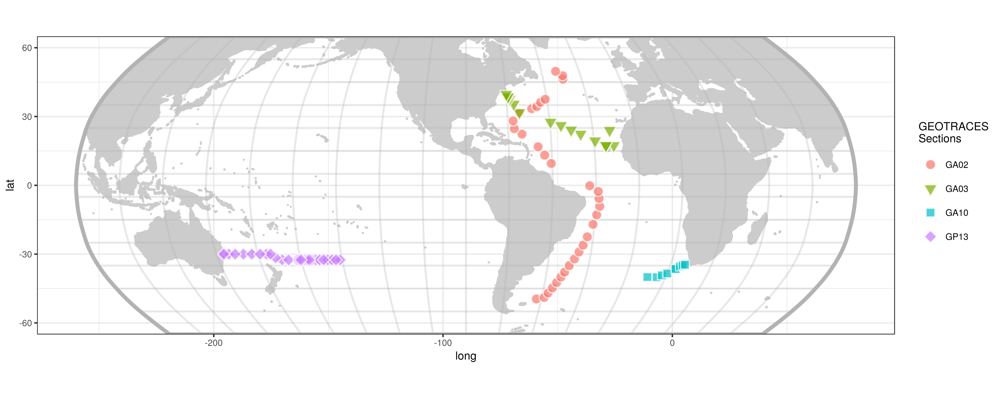

In [81]:
# plot stations
gg2 <- gg + geom_point(data=mgs, aes(x=long, y=lat, shape=Cruise, fill=Cruise), size=3, color="white", alpha=.7) +
    scale_shape_manual("GEOTRACES\nSections", values=c(21,25,22,23), na.value=15) +
    scale_fill_discrete("GEOTRACES\nSections")
gg2

In [9]:
DMS2Dd <- function(x){
    as.numeric(char2dms(x, chd = "°", chm = "'", chs = "\""))
}

## raw coordinates data frame - places
p0 <- data.frame(
    Name = c("HOT", "BATS"),
    Lat = c(22.75, DMS2Dd("31°40'N")),
    Long = c(-158, DMS2Dd("64°10'W"))
) %>% mutate(
    Lat_off = Lat+4,
    Long_off = Long-20
);

## project coordinates
p1 <- p0 %>% mutate(
    Long=proj_lat_long(Lat, Long, shift),
    Long_off=proj_lat_long(Lat_off, Long_off, shift))



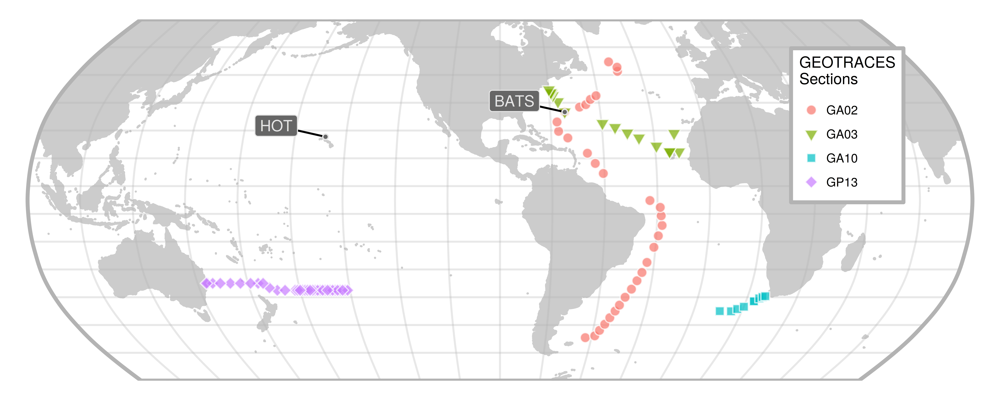

In [86]:
# Jupyter only!!! High Qual Plot
options(repr.plot.width=10, repr.plot.height=4, repr.plot.res=1024, repr.plot.quality=100)
#
# plot stations
t_map <- theme_void() + theme(
    # remove excessive whitespace around map
    #plot.background = element_rect(color = "black", fill="steelblue4"),
    plot.margin=grid::unit(c(0, -5, 0, -5), "mm"),
    # inset legend into map
    legend.background = element_rect(fill="white", colour = "grey70", size=1),
    legend.justification=c(0,1),
    legend.position=c(.78,.92),
    legend.text.align=0,
    legend.margin = margin(6, 6, 6, 6))

p_map <- gg2 + 
    geom_segment(data=p1, aes(x=Long_off, xend=Long, y=Lat_off, yend=Lat)) +
    geom_point(data=p1, aes(x=Long, y=Lat), shape=21, , fill="grey40", color="grey90", size=1.5, alpha=1) +
    geom_label(data=p1, aes(x=Long_off, y=Lat_off, label=Name), color="grey90", fill="grey40")
p_map + t_map


In [87]:
ggsave("metagenome-data-descriptor-map-02.png",  width=6, height=2.5, dpi=1200)
ggsave("metagenome-data-descriptor-map-02.pdf",  width=6, height=2.5, dpi=1200)

## Play around with depths

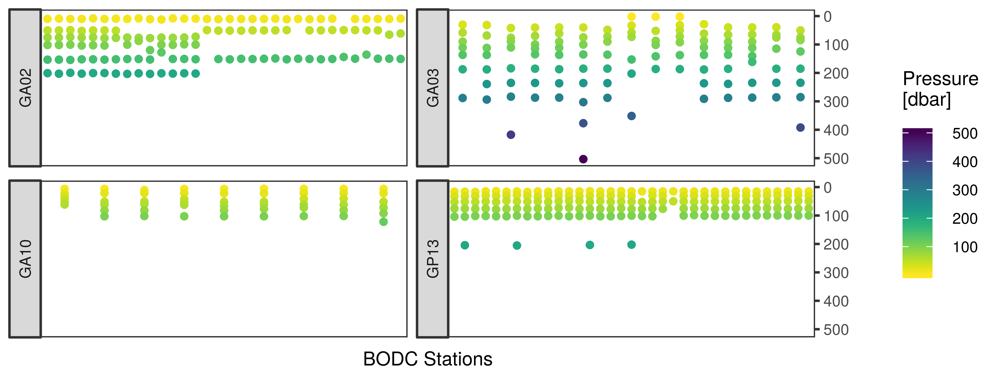

In [102]:
library(viridis)

# Jupyter only!!! High Qual Plot
options(repr.plot.width=8, repr.plot.height=3, repr.plot.res=1024, repr.plot.quality=100)
# defaults: options(repr.plot.width=7, repr.plot.height=7, repr.plot.res=120, repr.plot.quality=90)

mg1 <- mg0 %>% filter(`PRESSURE [dbar]` < 600)

t_prof <- theme_bw() + theme(
    #legend.background = element_rect(fill="white", colour = "grey70", size=1),
    axis.text.x=element_blank(),
    axis.ticks.x=element_blank(),
    panel.grid=element_blank()
)

p_prof <- ggplot(mg1) + 
    geom_point(aes(x=as.factor(`BODC Station`), y=`PRESSURE [dbar]`, color=`PRESSURE [dbar]`)) +
    scale_color_viridis("Pressure\n[dbar]", direction = -1) +
    facet_wrap(~Cruise, strip.position = "left", scales="free_x", ) +
    scale_x_discrete("BODC Stations") +
    scale_y_reverse("", position="right")

p_prof + t_prof


In [103]:
ggsave("metagenome-data-descriptor-depth-profiles.pdf", width=6, height=2.5)

In [70]:
library(patchwork)

# Jupyter only!!! High Qual Plot
options(repr.plot.width=10, repr.plot.height=7, repr.plot.res=1024, repr.plot.quality=100)

t_map <- theme_void() + theme(
    # remove excessive whitespace around map
    plot.background = element_rect(color = "black", fill="steelblue4"),
    plot.margin=grid::unit(c(-10, -35, -10, -35), "mm"),
    # inset legend into map
    legend.background = element_rect(fill="white", colour = "grey70", size=1),
    legend.justification=c(0,1),
    legend.position=c(.75,.9),
    legend.text.align=0,
    legend.margin = margin(6, 6, 6, 6))

#p_map + t_map

t_prof <- theme_bw() + theme(
    axis.text.x=element_blank(),
    axis.ticks.x=element_blank(),
    panel.grid=element_blank()
)

pp <- (p_map + t_map) / (p_prof + t_prof) + plot_layout(heights = c(6,6))
pp
ggsave("foo.png", pp, width=10, height=10)

Warning message in (function (..., na.rm = FALSE) :
“an argument will be fractionally recycled”

Warning message in (function (..., na.rm = FALSE) :
“an argument will be fractionally recycled”